# Gather data

In [1]:
import numpy as np
import time
from toptica.lasersdk.dlcpro.v2_0_3 import DLCpro,LaserHead,  NetworkConnection, DeviceNotFoundError
import os

In [2]:
def set_up_points(n_points=10):
    # pick n_points equally spaced points with distance to the borders
    scan_ranges = scanning_probe_logic._scan_ranges
    scan_range_x = scan_ranges['x']
    scan_range_y = scan_ranges['y']
    x_posis = np.linspace(scan_range_x[0], scan_range_x[1], 2*n_points+1)[1::2]
    y_posis = np.linspace(scan_range_y[0], scan_range_y[1], 2*n_points+1)[1::2]
    return x_posis, y_posis

def move_in_xy(x,y):
    scanning_probe_logic.set_target_position({'x':x, 'y':y})
    time.sleep(1)
    return

def turn_on_green(power = 80e3):
    # 80e3 are 80mW
    ibeam_smart.setPower(power)
    return

def turn_off_green():
    ibeam_smart.setPower(0)
    time.sleep(0.2)
    return

def do_optimize():
    a = scanning_optimize_logic.start_optimize()
    while scanning_optimize_logic.module_state()=='locked':
        time.sleep(1)
    return

def set_laser_offset(v):
    with DLCpro(NetworkConnection(dl_pro.tcp_address)) as dlc:
        dlc._laser1.dl.pc.voltage_set.set(v)
    return

def do_ple_scan(lines = 1, in_range = None, frequency=None, resolution=None, channel = None):
    """
    fine_scan_range = (
            self.ple_gui.fit_result[1].best_values['center']
            - self.ple_gui.fit_result[1].best_values['sigma'] * 3,
            self.ple_gui.fit_result[1].best_values['center']
            + self.ple_gui.fit_result[1].best_values['sigma']  * 3
        )
    """
    if channel is not None:
        ple_gui._mw.channel_comboBox.setCurrentText(channel) ## MAY BE MISTAKEN
        # ple_gui._mw.channel_comboBox.setCurrentText('APD4')
    #laser_scanner_logic.scan_ranges["a"]
    if in_range is None:
        ple_gui._mw.actionFull_range.triggered.emit()
    else:
        ple_gui.sigScanSettingsChanged.emit(
            {
            'range': {ple_gui.scan_axis: in_range}
            }
        )
    ple_gui._mw.number_of_repeats_SpinBox.setValue(lines)
    ple_gui._mw.number_of_repeats_SpinBox.editingFinished.emit()
    time.sleep(0.5)
    ple_gui._mw.actionToggle_scan.setChecked(True)
    ple_gui.toggle_scan()
    while laser_scanner_logic.module_state()=='locked':
            time.sleep(0.5)
    time.sleep(0.2)
    return


def save_ple(tag, poi_name=None, folder_name = None):
    if folder_name:
        ple_gui._save_folderpath = folder_name
        ple_gui.save_path_widget.currPathLabel.setText(ple_gui._save_folderpath)
    ple_gui.save_path_widget.saveTagLineEdit.setText(
        f"{poi_name}_{tag}"
        )
    ple_gui._mw.actionSave.triggered.emit()
    return

Things to do before starting:
- make sure needed modules are loaded (scanning_probe_logic, scanning_optimize_logic, ple_gui, scanner_gui, scanning_data_logic, ws_wavemeter, ibeam_smart, dl_pro)
- specify path where the PLEs should be saved
- set optimizer to only z
- adjust scan window

In [3]:
scanning_probe_logic
scanning_optimize_logic
ple_gui
scanner_gui
scanning_data_logic
ws_wavemeter
ibeam_smart
dl_pro

<qudi.hardware.laser.toptica_dl_pro.DlProLaser(0x28484ac6810) at 0x0000028485027680>

In [4]:
# Vlad magic to fix optimizer
scanning_optimize_logic._delay_next_sequence_step = 15
scanning_optimize_logic._optimize_spline_options = {
        "to_spline_2d": True,
        "s_2d": 1,
        "to_spline_1d": True,
        "s_1d": 1,
    }

In [ ]:
n_points = 9
n_lines = 20
voltages = [5, 40, 75]


x_posis, y_posis = set_up_points(n_points=n_points)
n_voltages = len(voltages)
for k, voltage in enumerate(voltages):
    set_laser_offset(voltage)
    time.sleep(3)
    for i,x in enumerate(x_posis):
        print('x(%d) = %f'%(i,x))
        for j,y in enumerate(y_posis):
            print('y(%d) = %f'%(j,y))
            move_in_xy(x,y)
            turn_on_green()
            do_optimize()
            turn_off_green()
            do_ple_scan(lines=n_lines)
            w0 = 484.130 #THz
            current_wl = ws_wavemeter.get_current_wavelength()
            print(current_wl)
            wavelength = (current_wl - w0) * 1e3   # to GHz
            print(wavelength)
            name = 'point_%d_%d_window_%d_%.2fGHz' % (i,j,k,wavelength)
            save_ple(tag=name)
            num_step = (j+1) + n_points*i + n_points*n_points*k
            total_steps = n_points * n_points * n_voltages
            print('Scan %d/%d completed for window %d starting at %.2fGHz.'%(num_step, total_steps, k, wavelength))

x(0) = -0.000009
y(0) = -0.000006


# Data analysis

## move relevant data into folders

In [1]:
import os
import shutil
import re

In [2]:
def move_files_by_window(source_folder):
    """
    Moves specific files into subfolders based on their window number.
    Only moves files containing 'cummulative_1D-scan_with_a_axes_from_channel_APD1'.
    
    :param source_folder: Path to the folder to scan
    """
    # Iterate over files in source folder
    for filename in os.listdir(source_folder):
        file_path = os.path.join(source_folder, filename)
        
        # Check if the filename contains the required string
        if "cummulative_1D-scan_with_a_axes_from_channel_APD1" in filename:
            # Match filenames containing 'window_X'
            match = re.search(r'window_(\d+)', filename)
            if match:
                window_number = match.group(1)
                target_folder = os.path.join(source_folder, f'window{window_number}')
                os.makedirs(target_folder, exist_ok=True)
                new_path = os.path.join(target_folder, filename)
                shutil.move(file_path, new_path)
                print(f"Moved: {filename} -> {target_folder}")
                
source_folder = r'Z:\Oliver\measurements\238\2025-02-27_ple-on-spots\region-D_soft-icp'
move_files_by_window(source_folder)

## analyze data

In [1]:
import os
import re
import numpy as np
import matplotlib.pyplot as plt

In [16]:
def load_data_from_subfolder(subfolder, source_folder):
    """
    Loads data from .dat files in the specified subfolder.
    Each entry in the dictionary contains the data and scan range.
    
    :param subfolder_path: Path to the subfolder to scan
    :return: Dictionary of filenames with 'data' and 'scan_range' keys
    """
    subfolder_path = os.path.join(source_folder, subfolder)

    data_dict = {}
    
    for filename in os.listdir(subfolder_path):
        if "cummulative_1D-scan_with_a_axes_from_channel_APD1" in filename and filename.endswith(".dat"):
            file_path = os.path.join(subfolder_path, filename)
            
            # Read file and find metadata and where data starts
            with open(file_path, "r") as file:
                lines = file.readlines()
            
            scan_range = None
            for line in lines:
                match = re.search(r'a scan range=\(([-\d\.]+), ([-\d\.]+)\)', line)
                if match:
                    scan_range = (float(match.group(1)), float(match.group(2)))
                    break
            
            data_start = next(i for i, line in enumerate(lines) if not line.startswith("#"))
            
            # Load the numerical data as a 2D NumPy array
            data_array = np.loadtxt(file_path, delimiter="\t", skiprows=data_start)
            
            # Store in dictionary
            data_dict[filename] = {"data": data_array, "scan_range": scan_range}
            # print(f"Loaded data from: {filename}")
    
    return data_dict


def sort_data(data, min_snr=10):
    data_noise = {}
    data_signal = {}

    for key in data.keys():
        _data = data[key]['data']
        mean_data = np.mean(_data)
        std_data = np.std(_data)
        max_data = np.max(_data)
        snr_data = (max_data - mean_data) / std_data
        if snr_data > min_snr:
            data_signal[key] = _data
        else:
            data_noise[key] = _data
    
    return data_signal, data_noise


def extract_metadata_from_filename(filename):
    """
    Extracts pixel numbers, window number, and frequency from the filename.
    
    :param filename: String containing the filename
    :return: Tuple (pixel_x, pixel_y, window_number, frequency)
    """
    match = re.search(r'point_(\d+)_(\d+)_window_(\d+)_([-\d\.]+)GHz', filename)
    if match:
        pixel_x = int(match.group(1))
        pixel_y = int(match.group(2))
        window_number = int(match.group(3))
        frequency = float(match.group(4))
        return pixel_x, pixel_y, window_number, frequency
    else:
        return None


def plot_data(data_array, xange=None, title=None):
    """
    Plots a 2D array using matplotlib.pyplot with adjustable pixel height.
    
    :param data_array: 2D NumPy array to be plotted
    :param pixel_height: Height of each pixel row in the visualization
    """
    plt.figure(figsize=(10, 6))
    plt.imshow(data_array, aspect='auto', cmap='RdBu_r', origin='lower', interpolation='nearest')
    plt.xlim(xrange)
    plt.colorbar(label='Intensity')
    plt.xlabel('detuning [GHz]')
    plt.ylabel('scan line')
    plt.title(title)
    plt.show()
    return


def plot_data_from_dict(data_dict, pixel_height=30):
    for key in data_dict.keys():
        _data_dict = data_dict[key]
        _data = _data_dict['data']
        scan_range = _data_dict['scan_range']
        mean_data = np.mean(_data)
        std_data = np.std(_data)
        max_data = np.max(_data)
        snr_data = (max_data - mean_data) / std_data
        pixel_x, pixel_y, window_number, frequency = extract_metadata_from_filename(key)
        title = 'Point (%d,%d) in windwo %d starting at %.2fGHz with SNR %.1f'%(pixel_x, pixel_y, window_number, frequency, snr_data)
        plot_data(_data, xrange=scan_range,title=title)
    return

In [17]:
source_folder = r'Z:\Oliver\measurements\238\2025-02-27_ple-on-spots\region-D_soft-icp'

data0 = load_data_from_subfolder(subfolder='window0', source_folder=source_folder)
data1 = load_data_from_subfolder(subfolder='window1', source_folder=source_folder)
data2 = load_data_from_subfolder(subfolder='window2', source_folder=source_folder)

In [18]:
min_snr=10

data_signal0, data_noise0 = sort_data(data=data0, min_snr=min_snr)
data_signal1, data_noise1 = sort_data(data=data1, min_snr=min_snr)
data_signal2, data_noise2 = sort_data(data=data2, min_snr=min_snr)

In [5]:
print('Window0: %d/%d signal, %d/%d noise' % (len(data_signal0), len(data_signal0)+len(data_noise0),len(data_noise0),len(data_signal0)+len(data_noise0)))
print('Window1: %d/%d signal, %d/%d noise' % (len(data_signal1), len(data_signal1)+len(data_noise1),len(data_noise1),len(data_signal1)+len(data_noise1)))
print('Window2: %d/%d signal, %d/%d noise' % (len(data_signal2), len(data_signal2)+len(data_noise2),len(data_noise2),len(data_signal2)+len(data_noise2)))

Window0: 37/81 signal, 44/81 noise
Window1: 55/81 signal, 26/81 noise
Window2: 78/81 signal, 3/81 noise


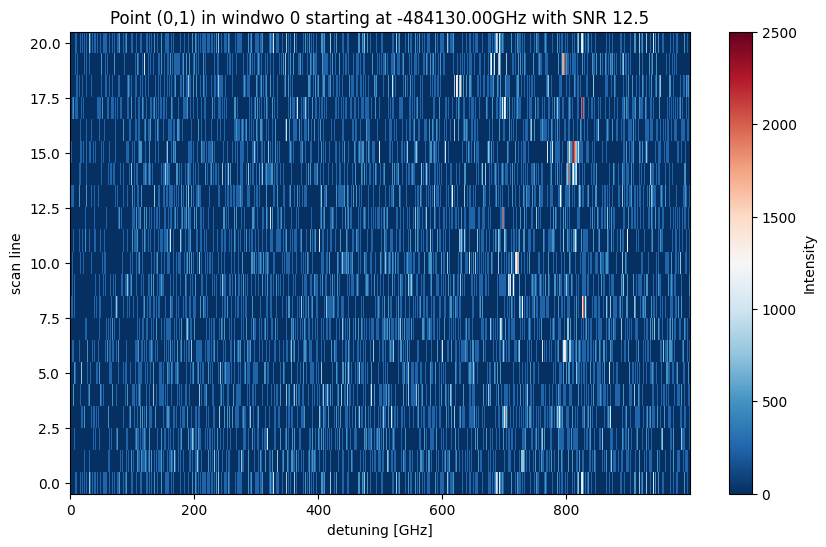

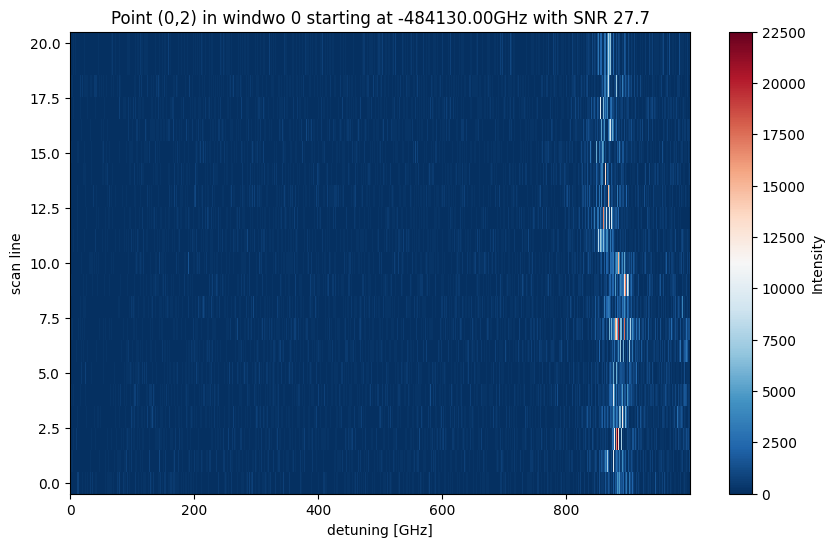

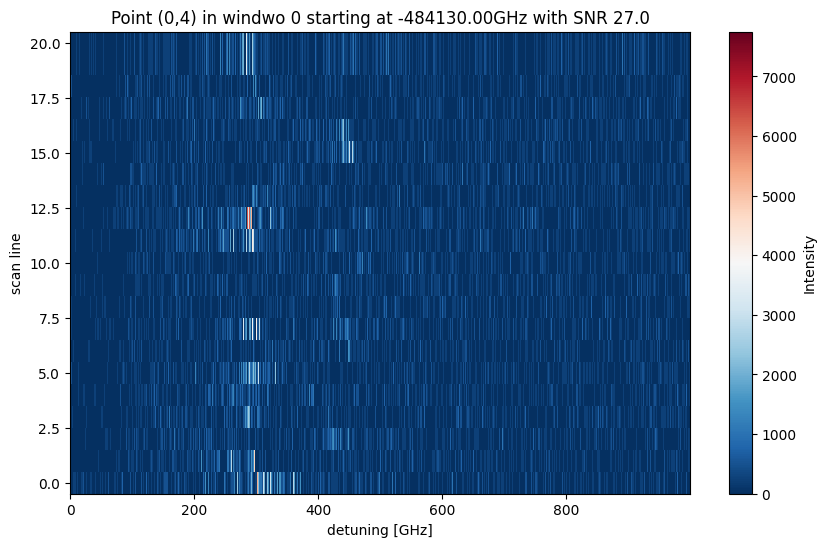

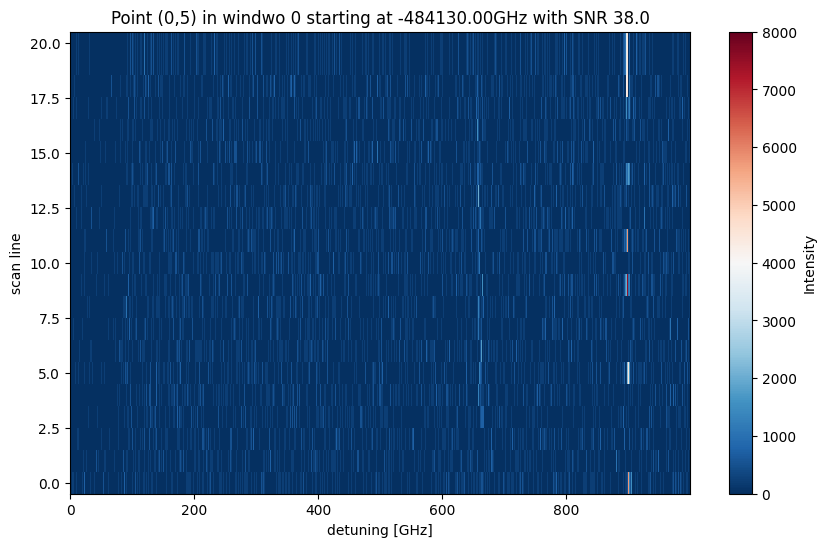

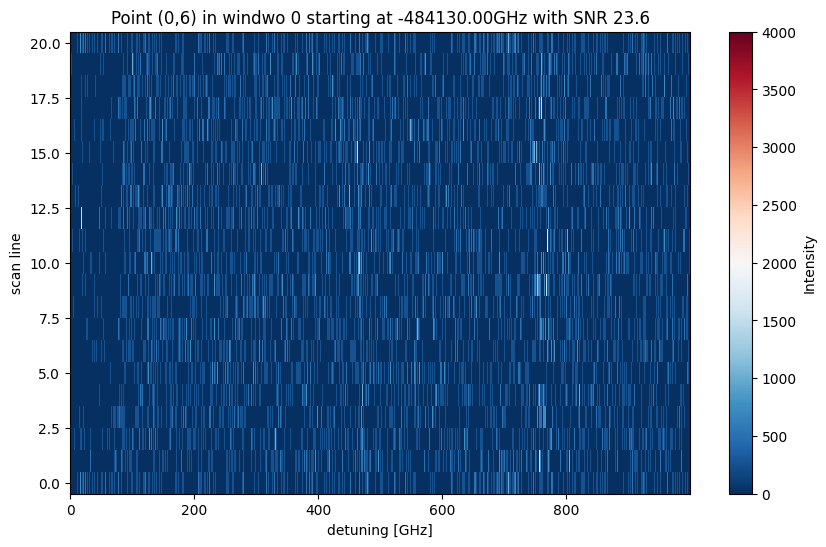

...

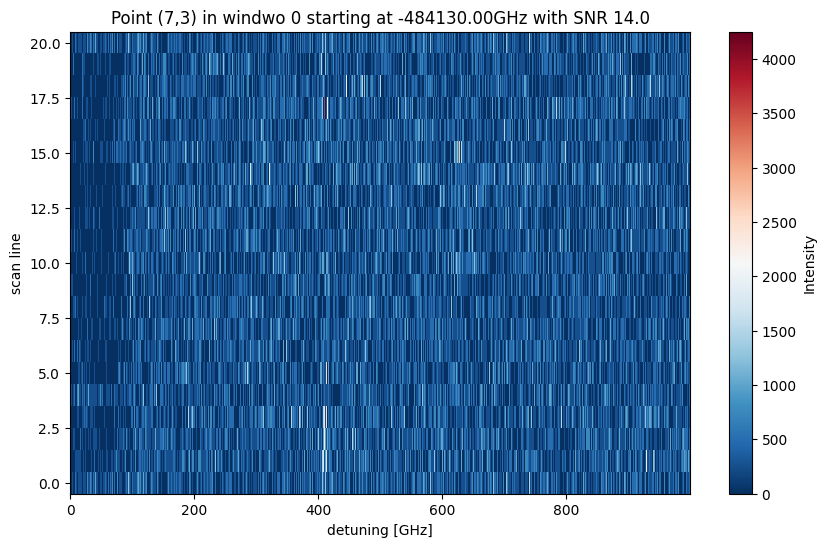

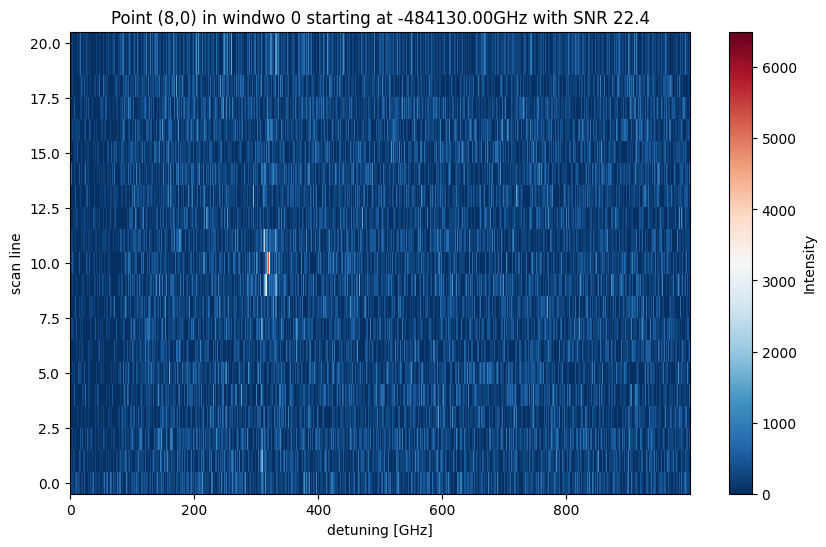

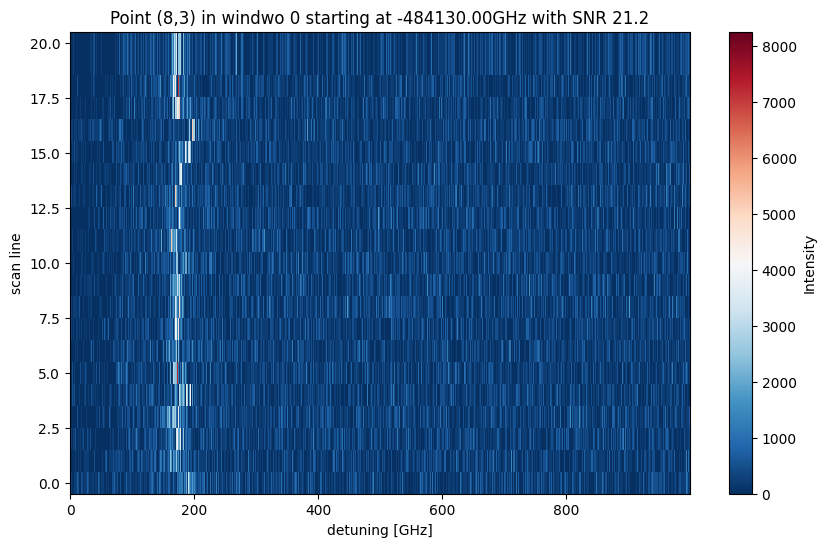

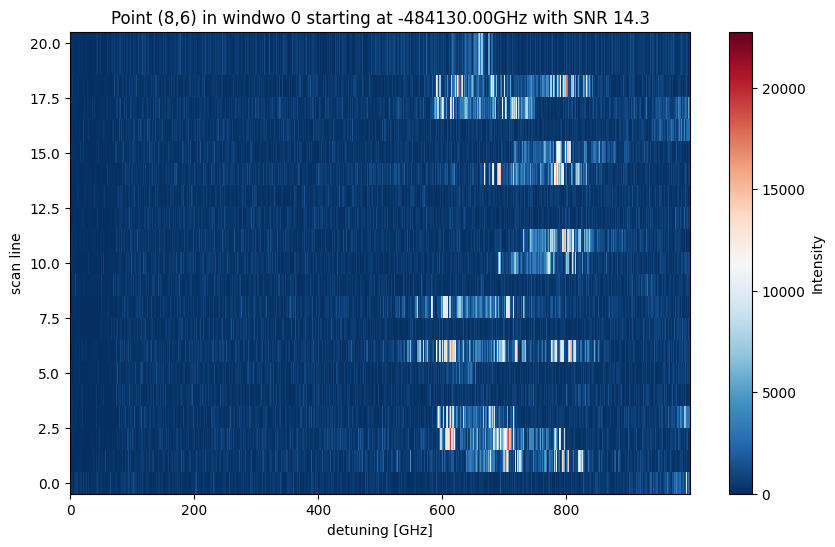

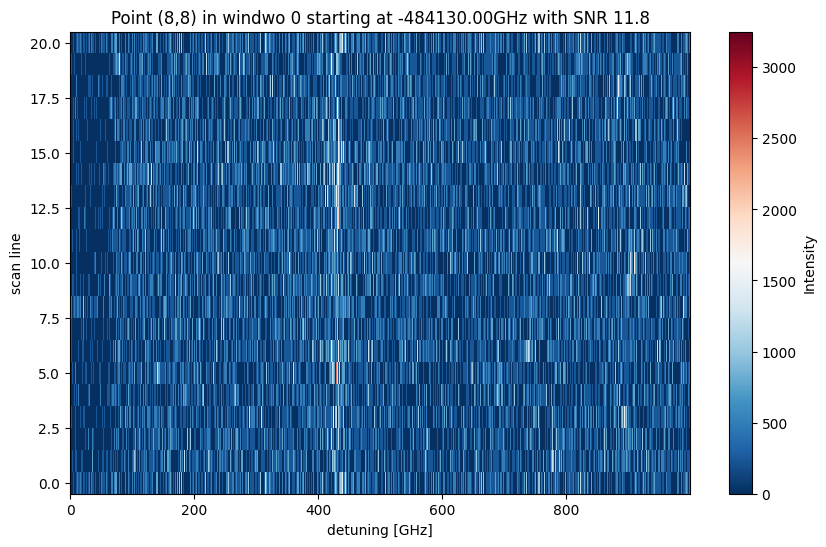

In [ ]:
plot_data_from_dict(data_signal0)

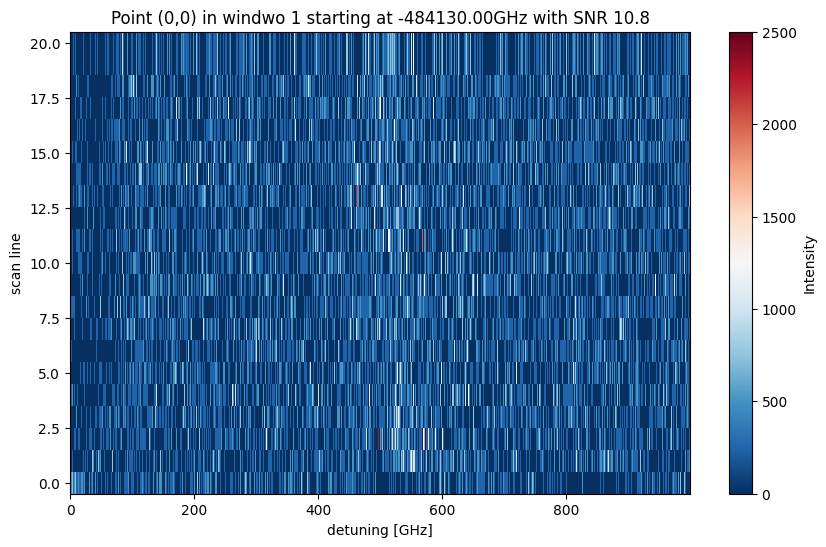

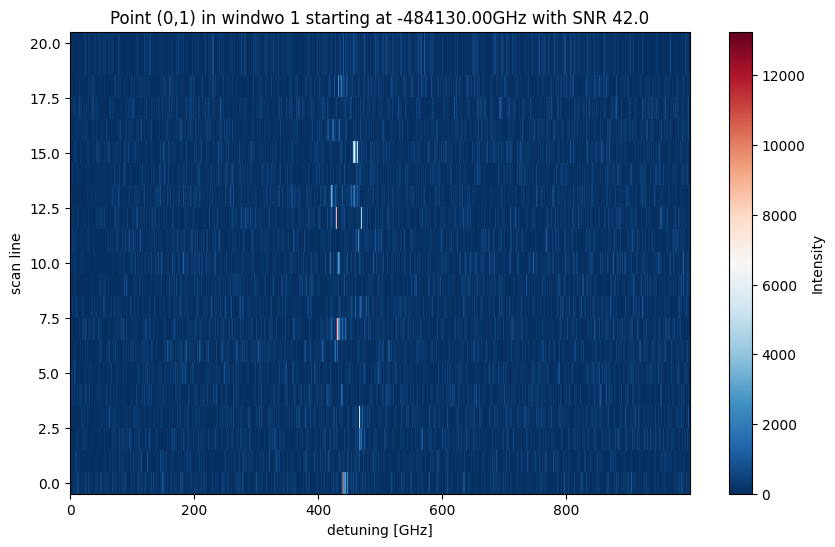

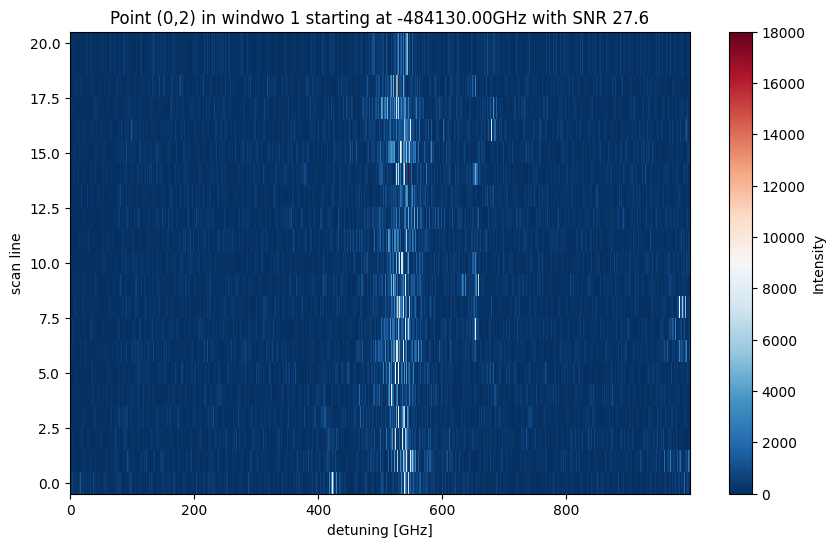

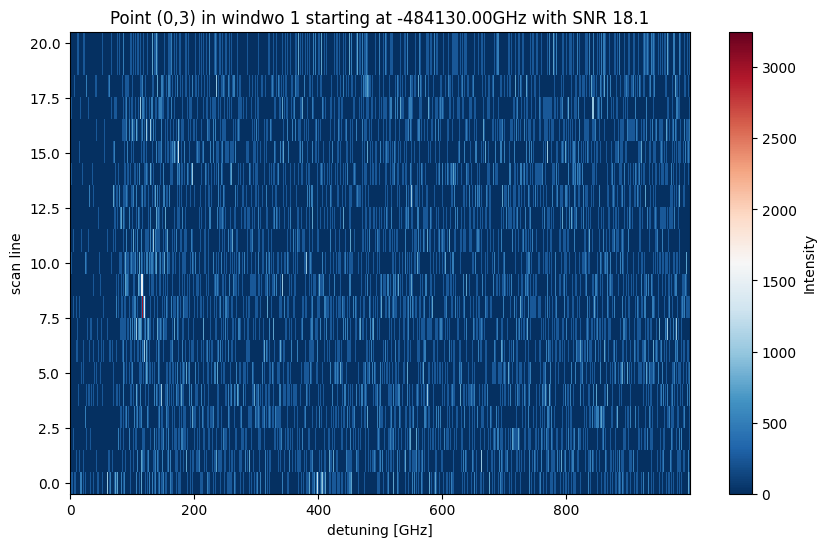

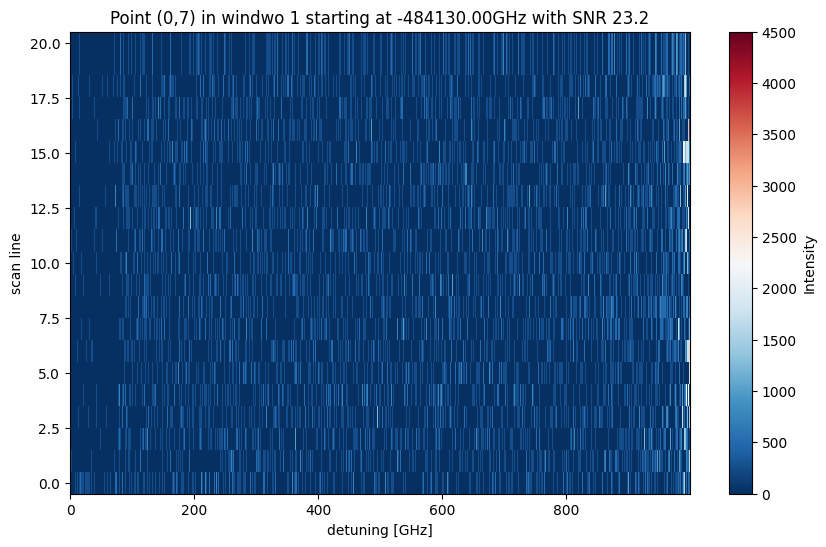

...

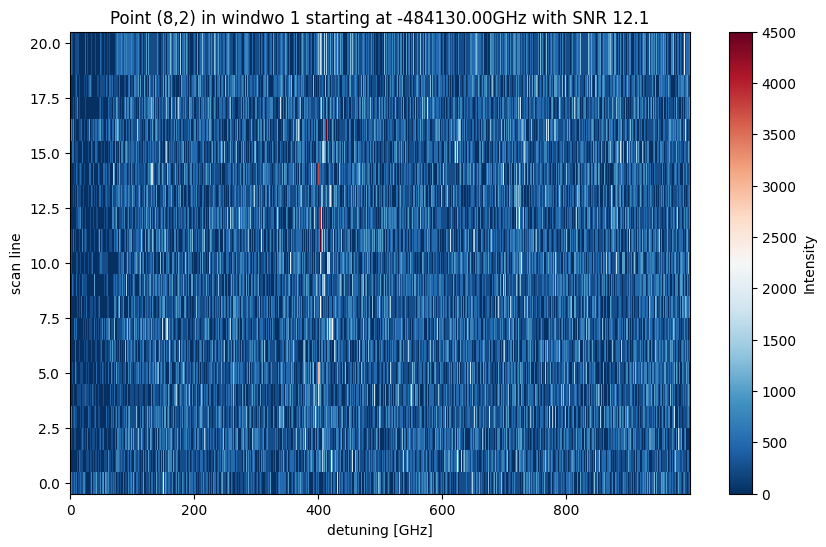

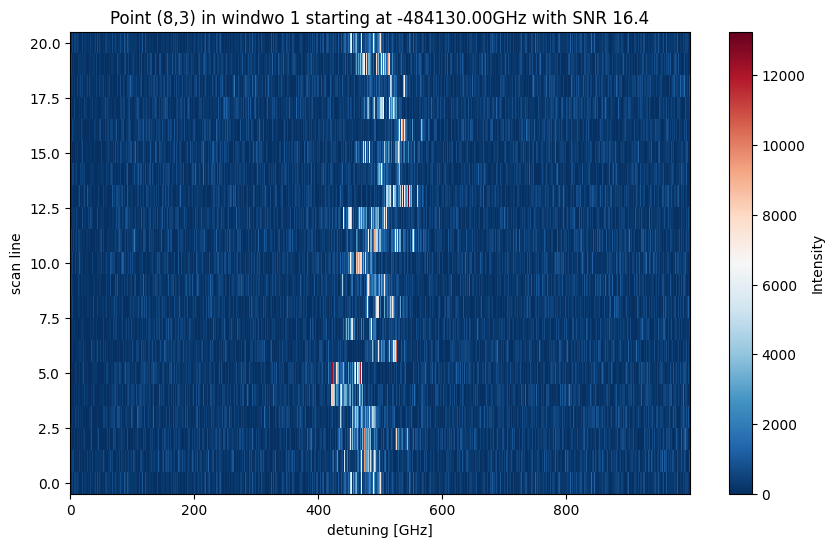

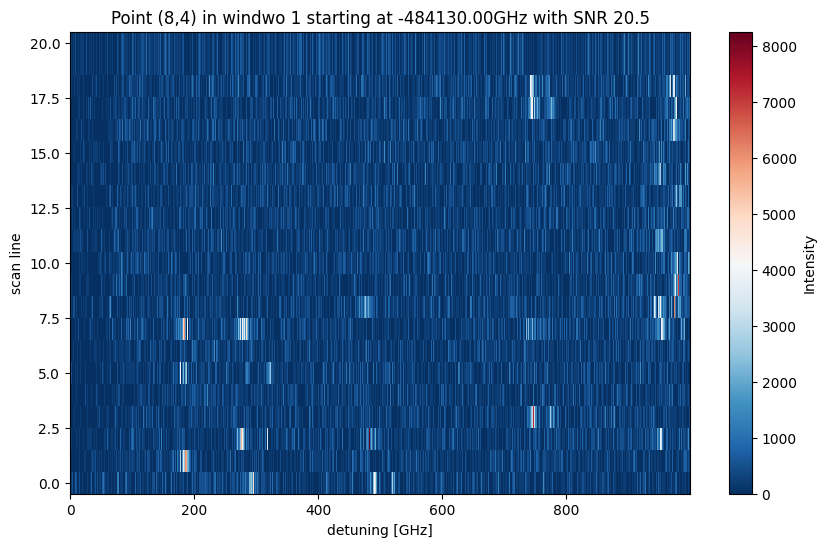

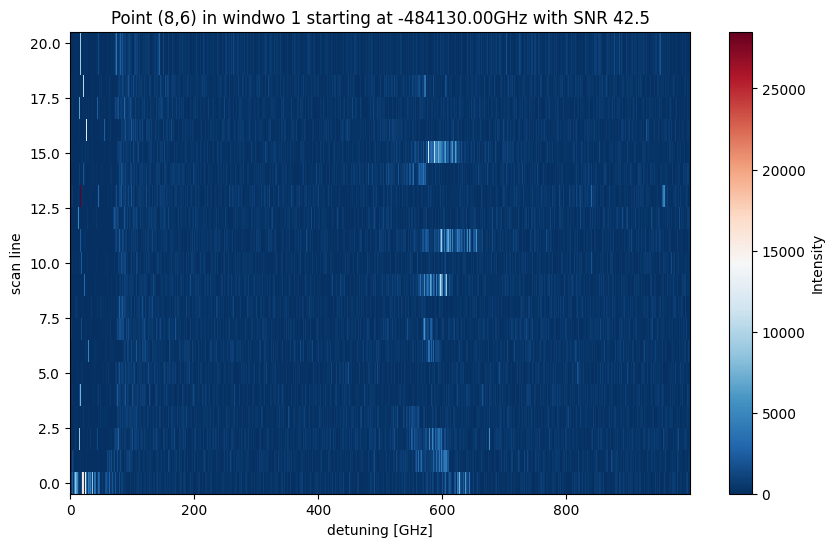

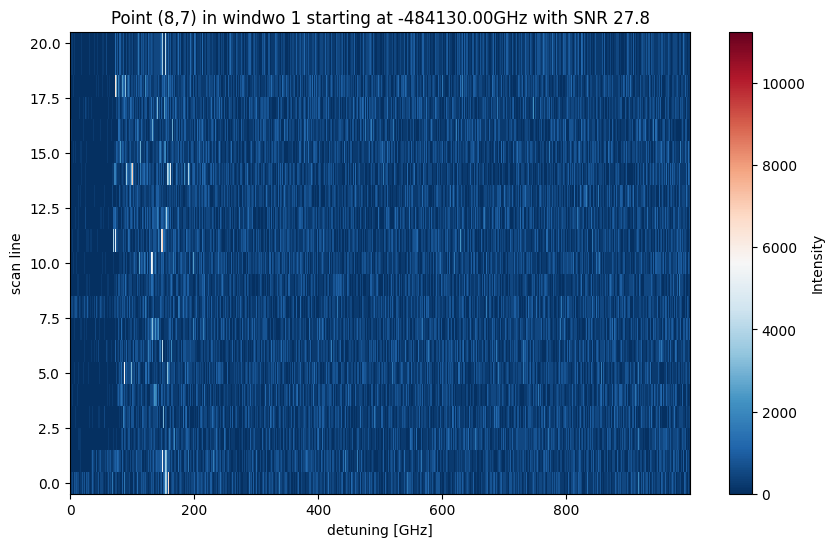

In [ ]:
plot_data_from_dict(data_signal1)

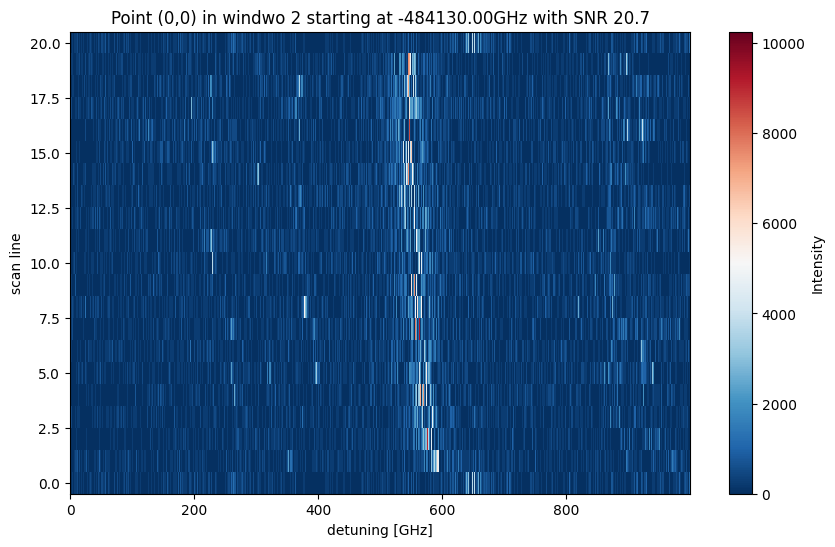

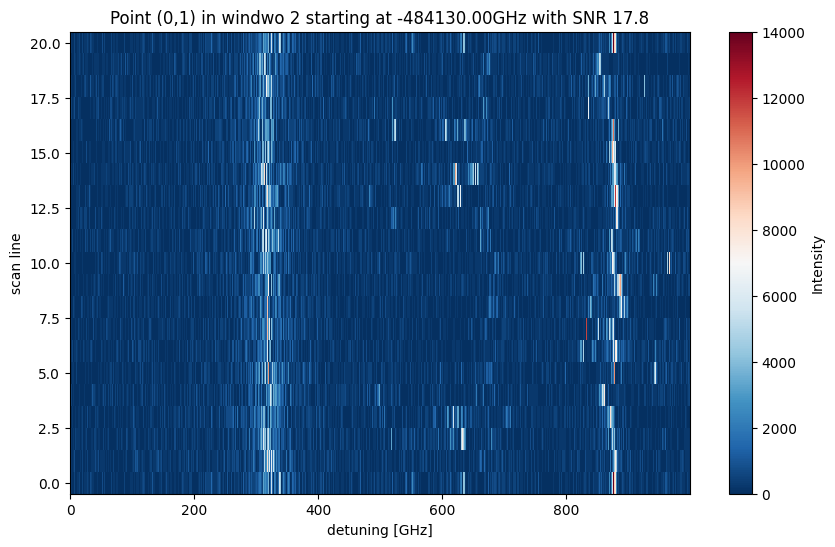

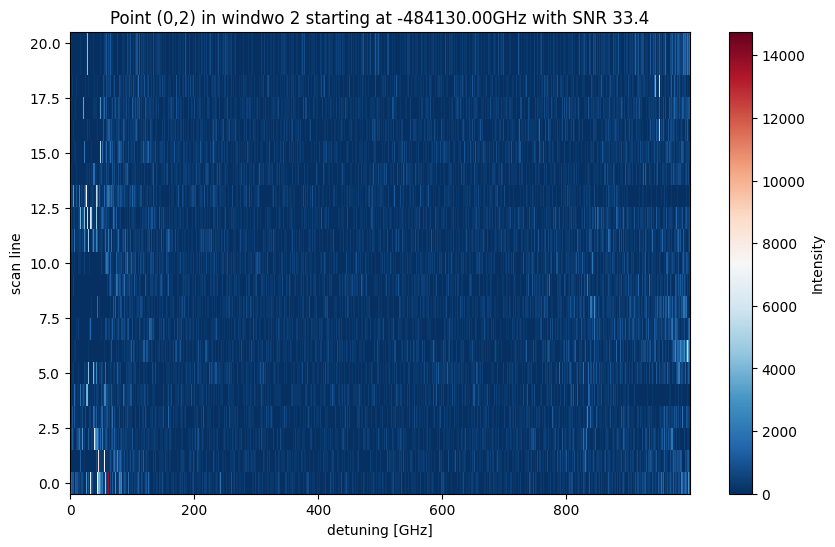

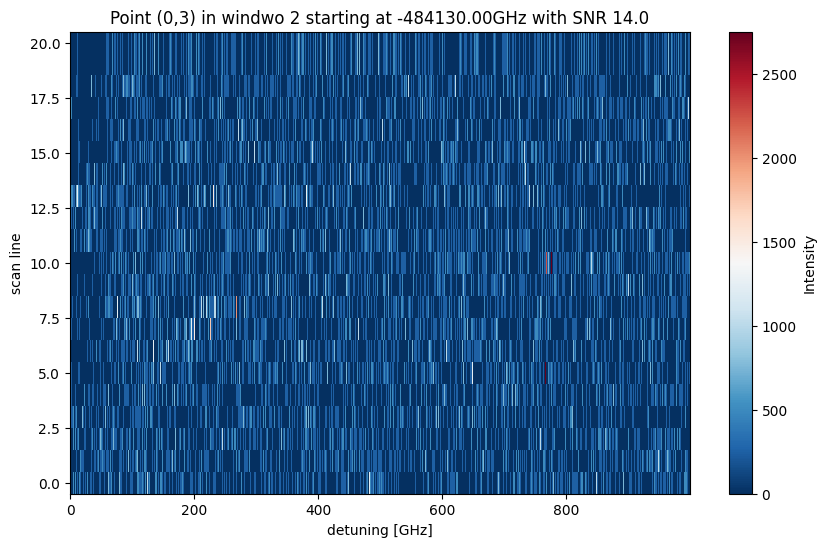

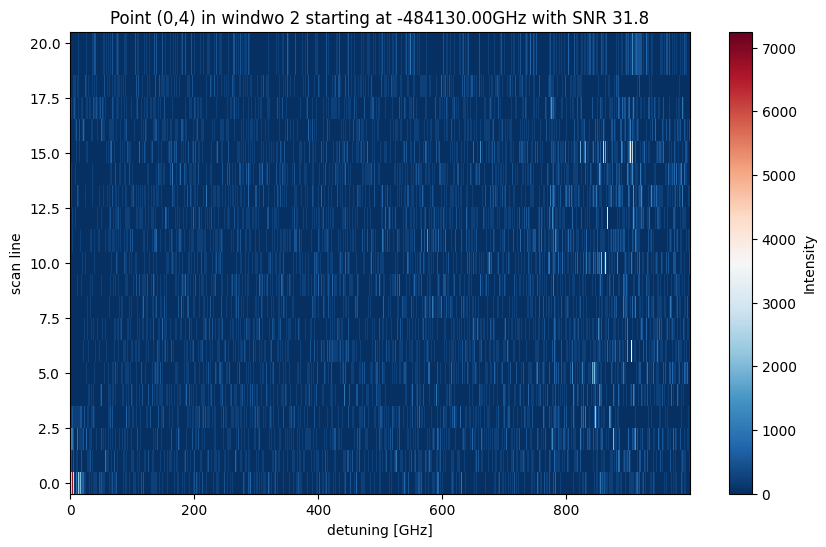

...

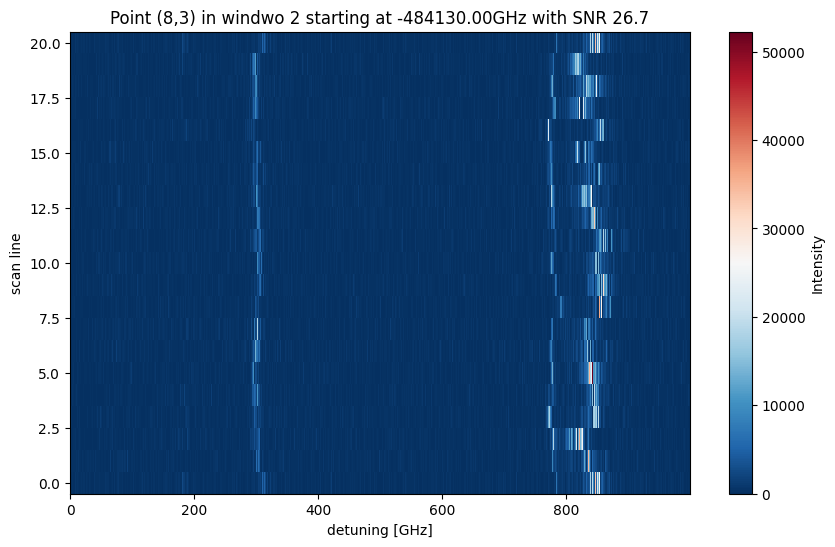

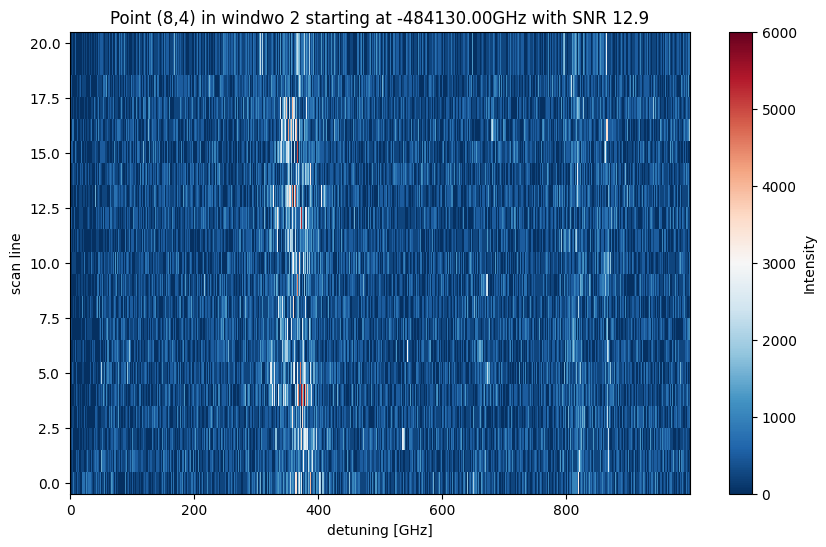

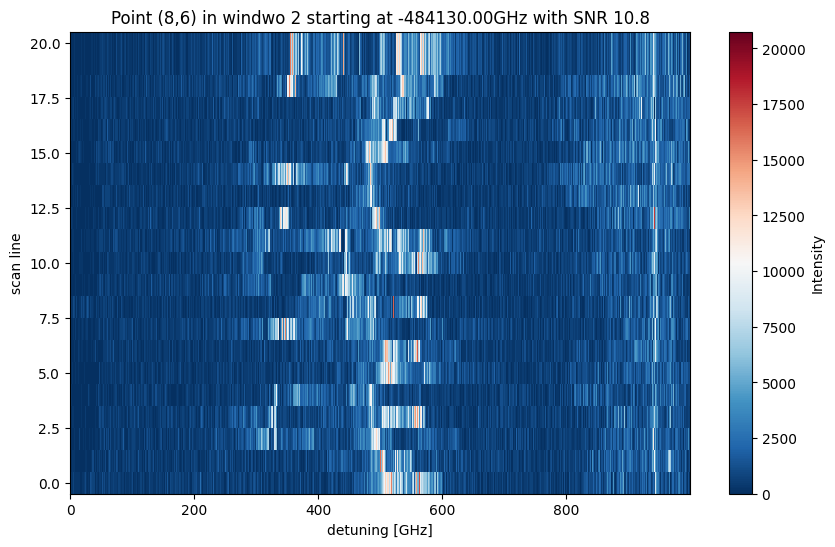

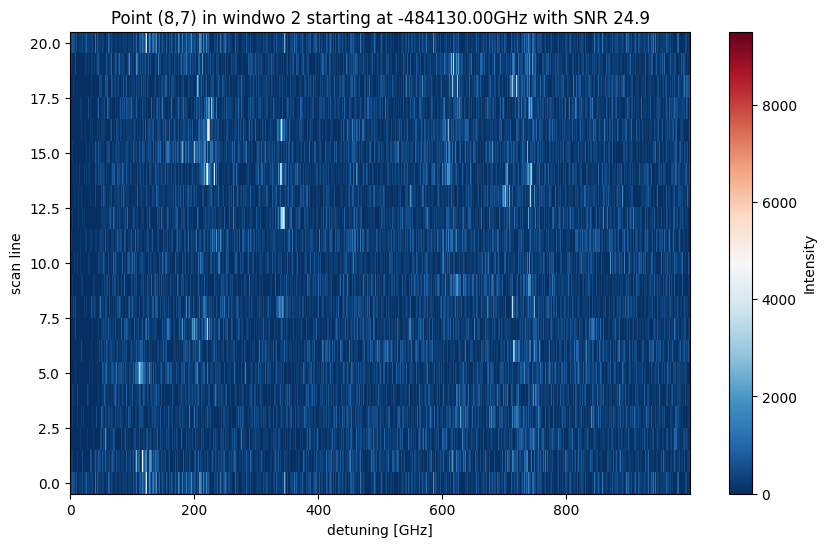

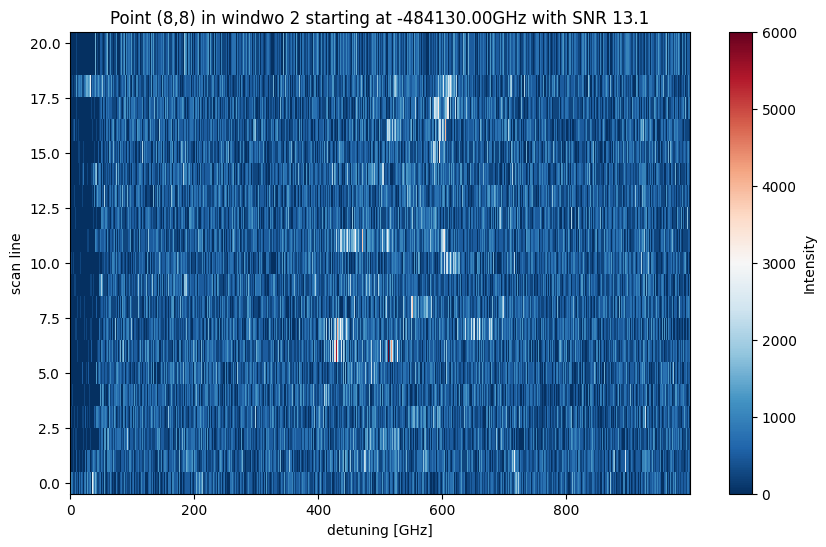

In [ ]:
plot_data_from_dict(data_signal2)

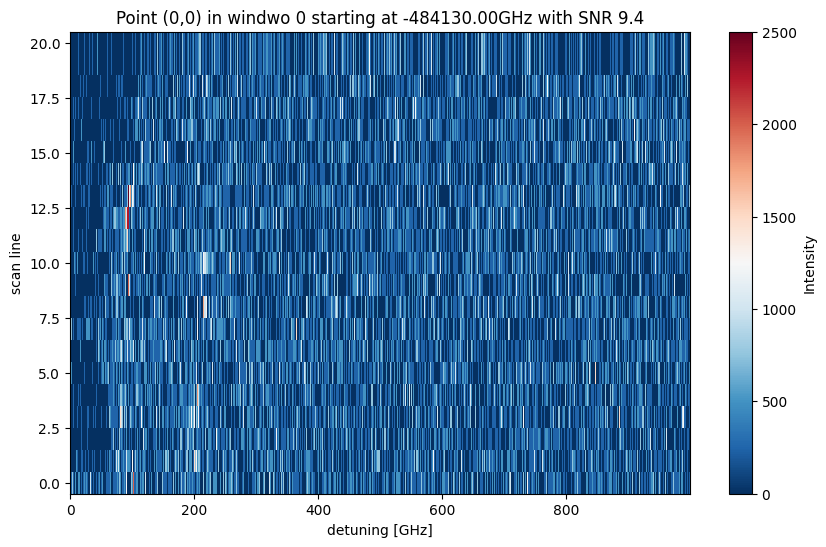

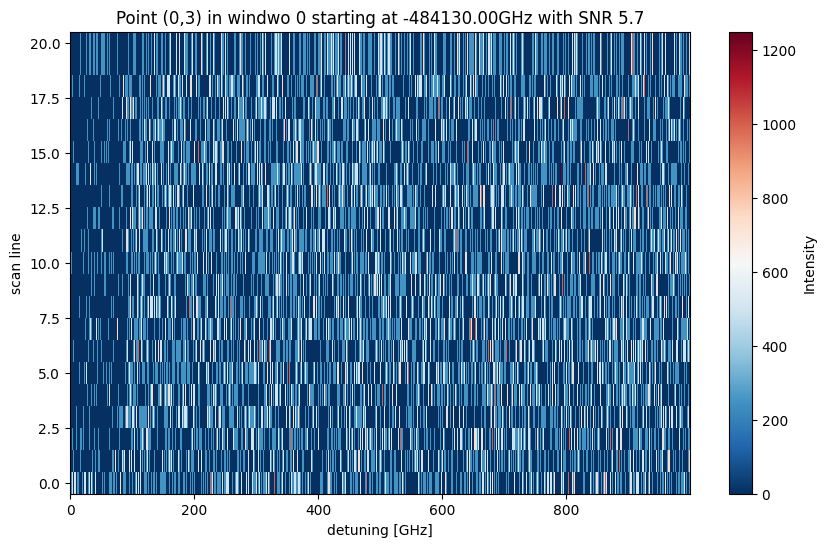

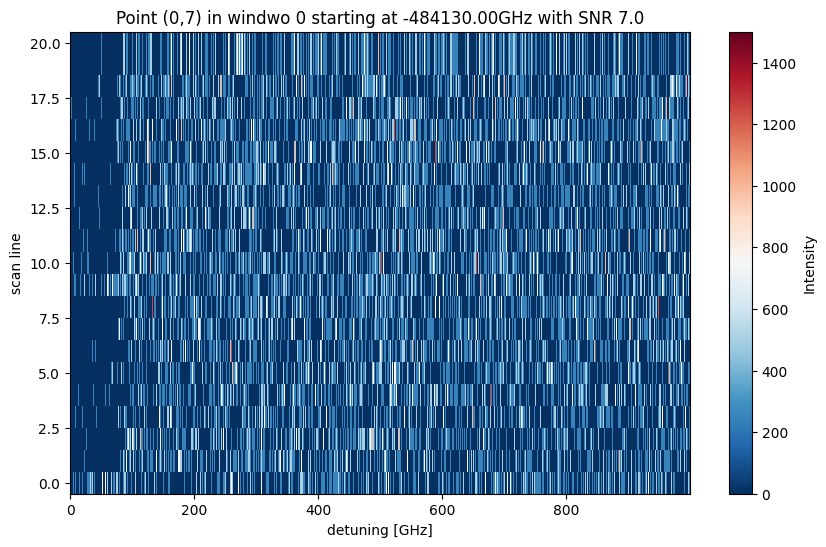

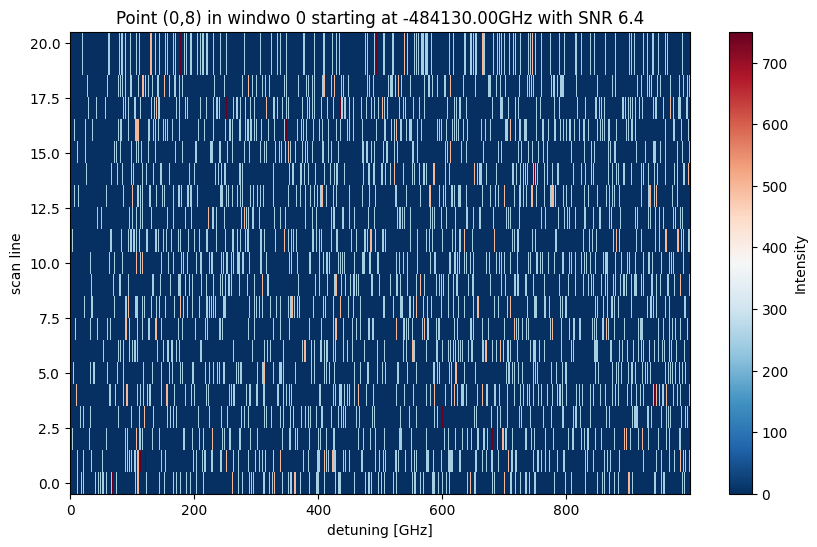

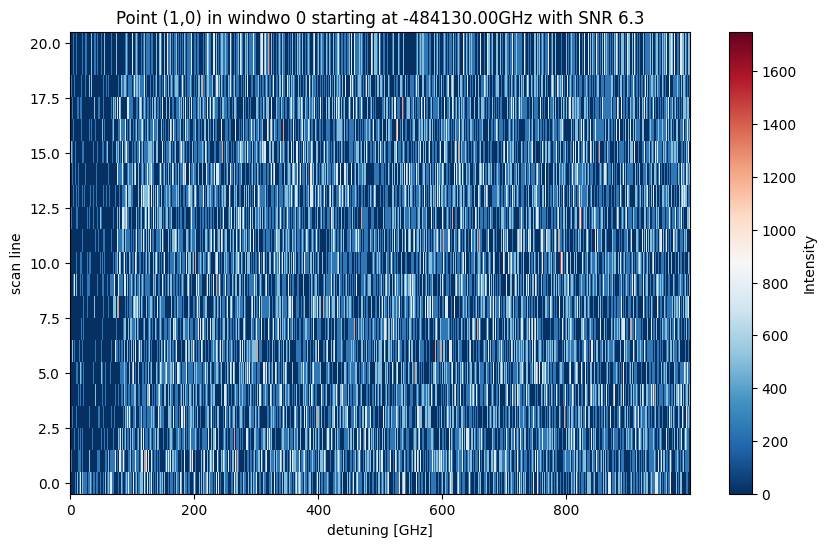

...

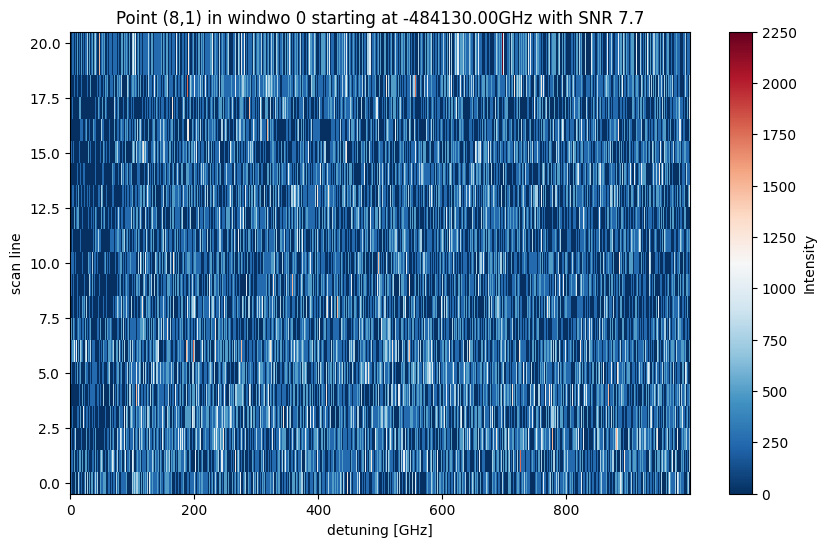

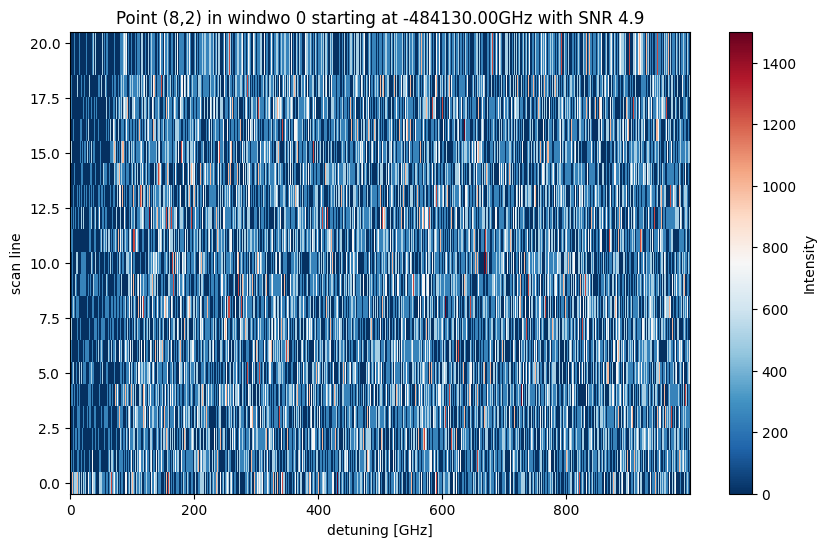

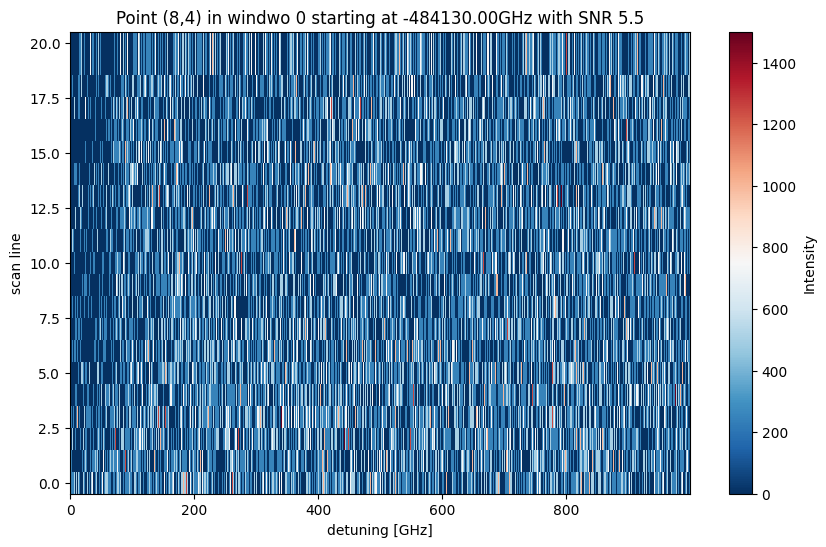

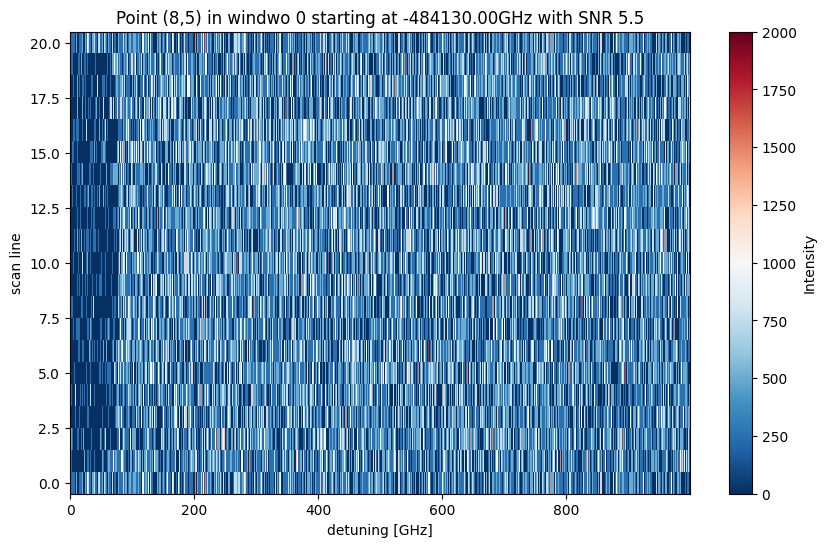

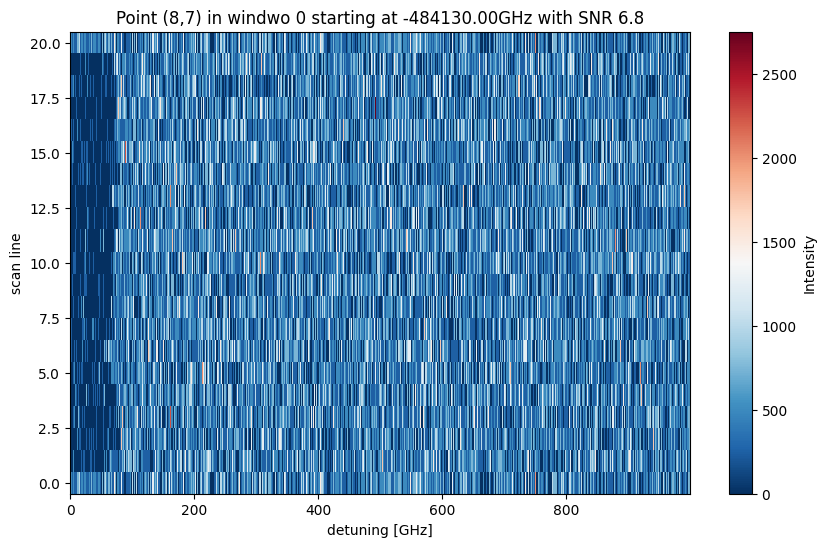

In [ ]:
plot_data_from_dict(data_noise0)

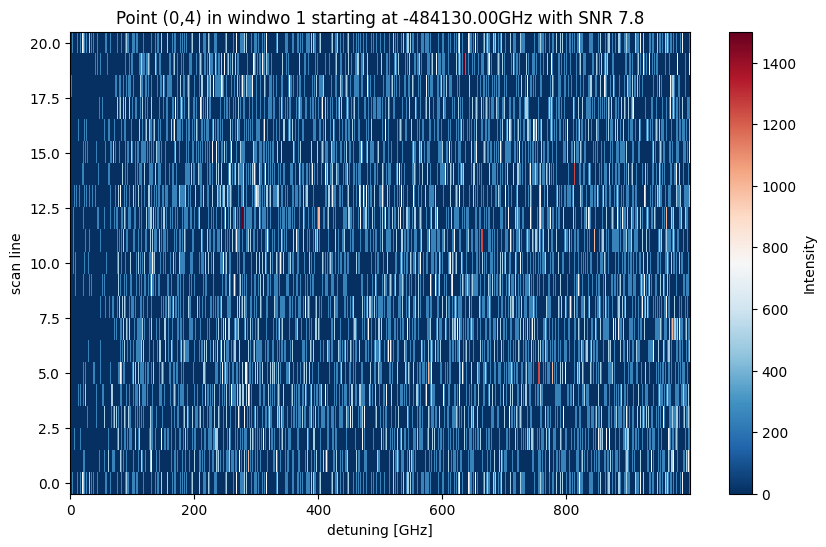

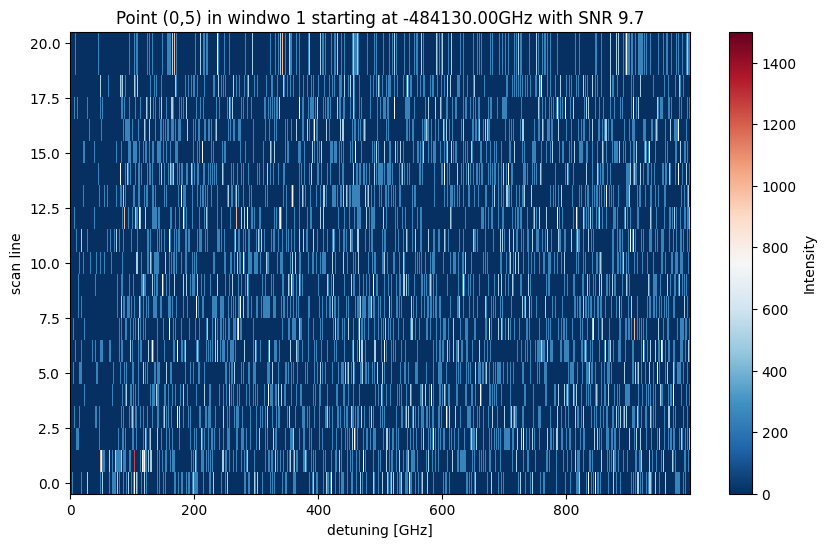

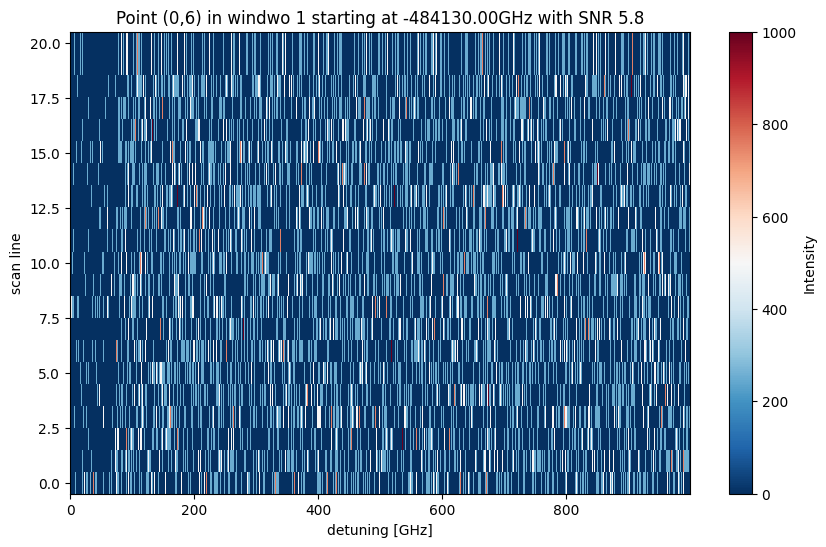

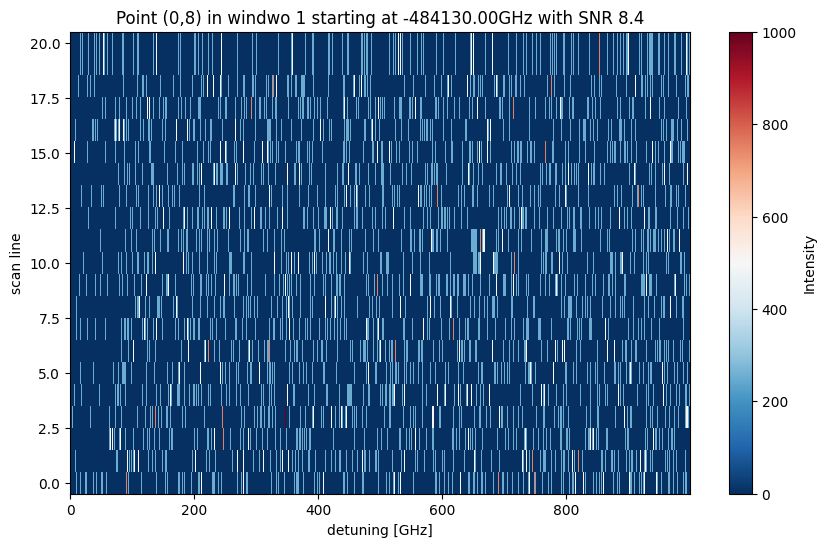

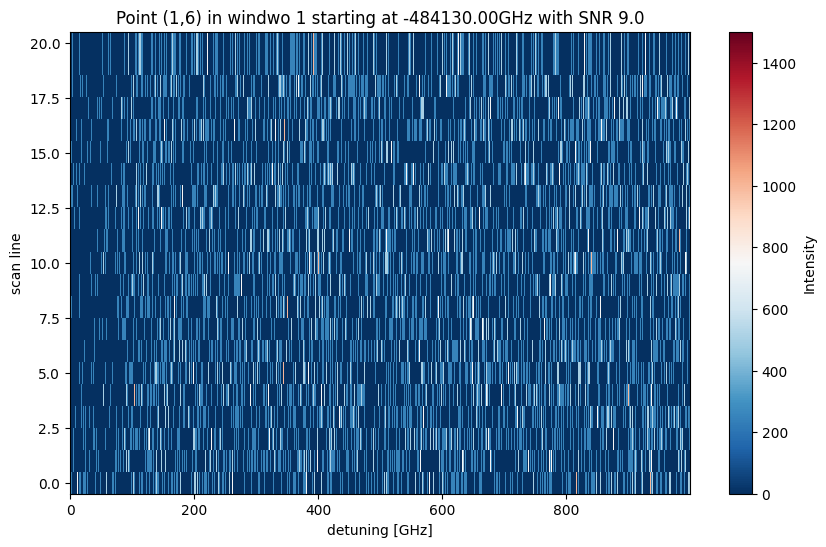

...

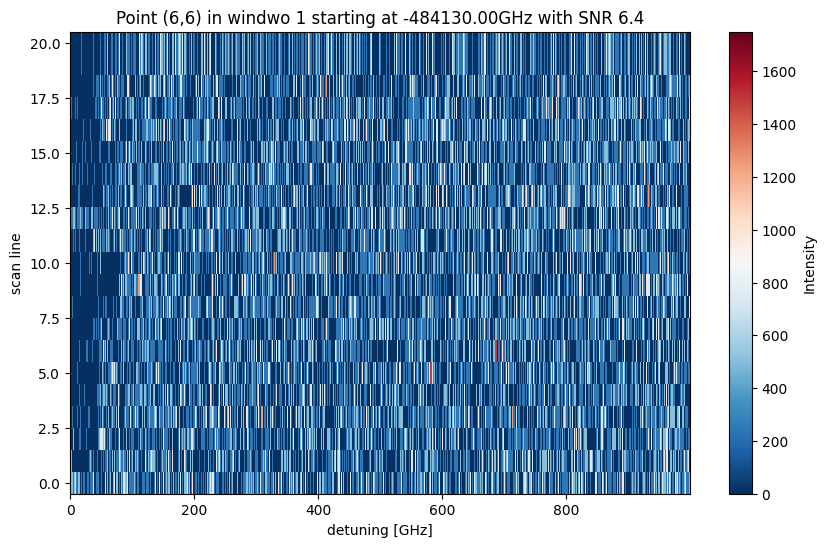

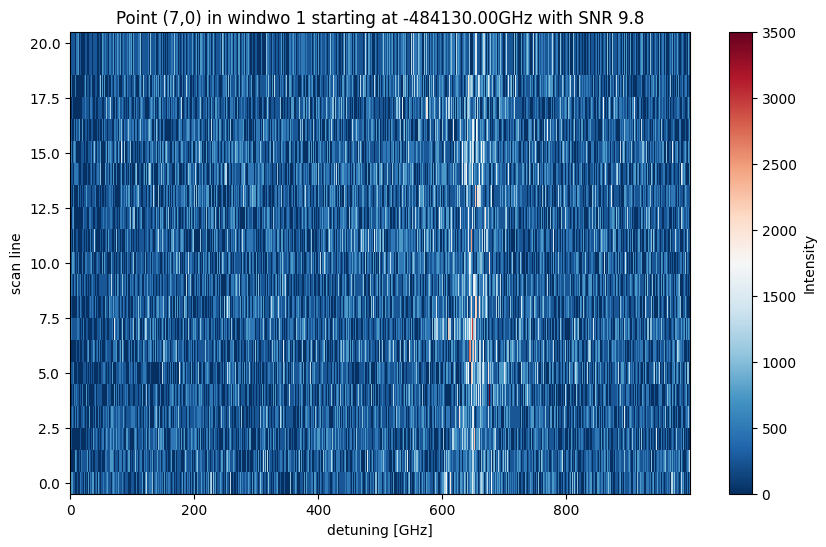

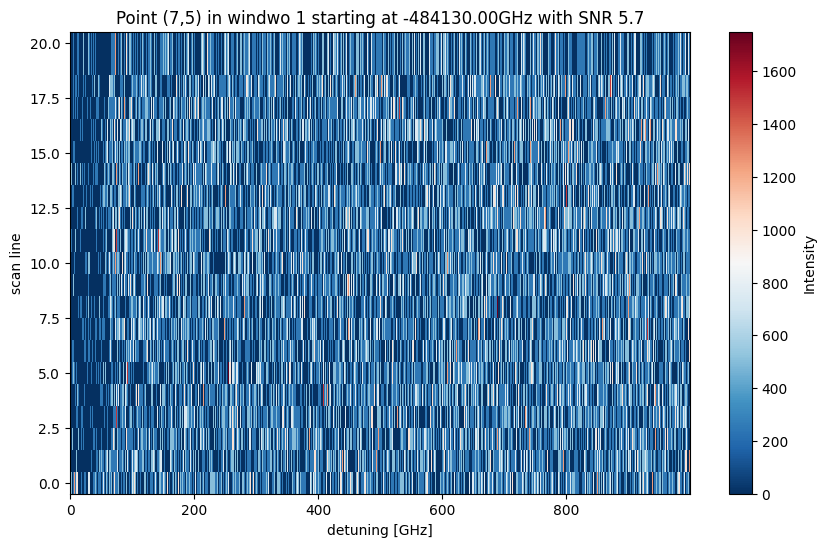

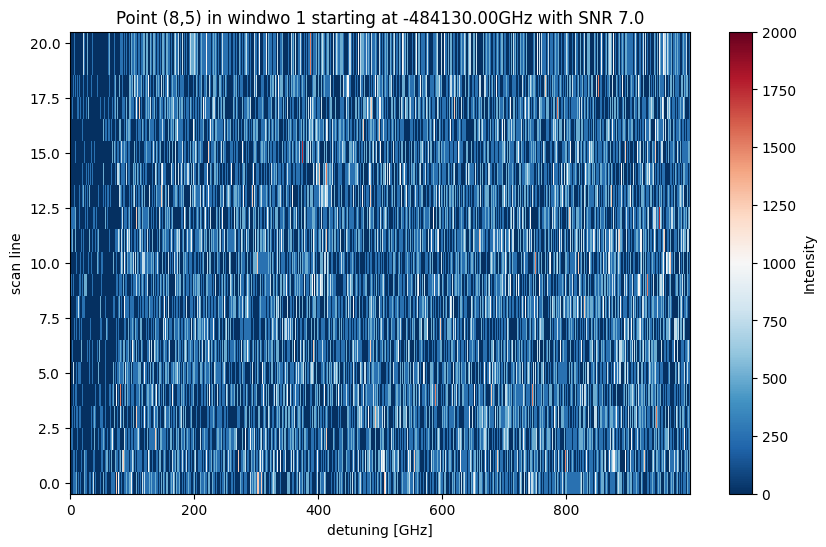

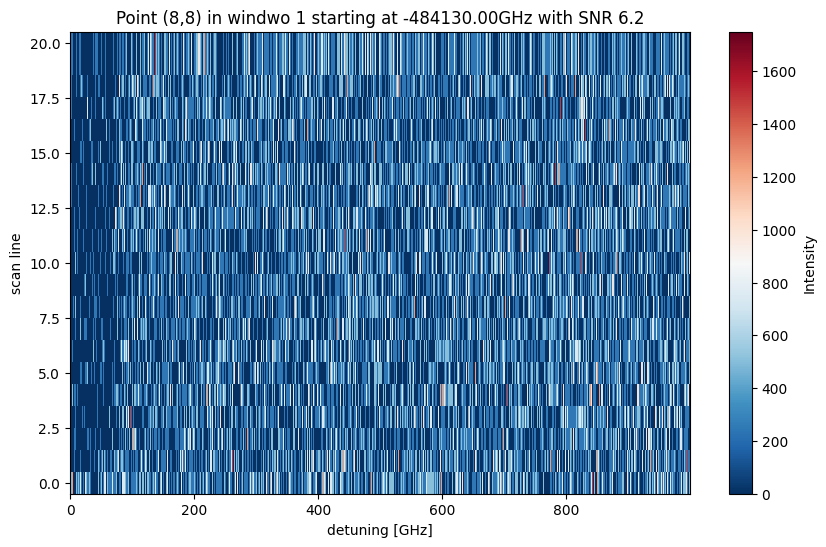

In [ ]:
plot_data_from_dict(data_noise1)

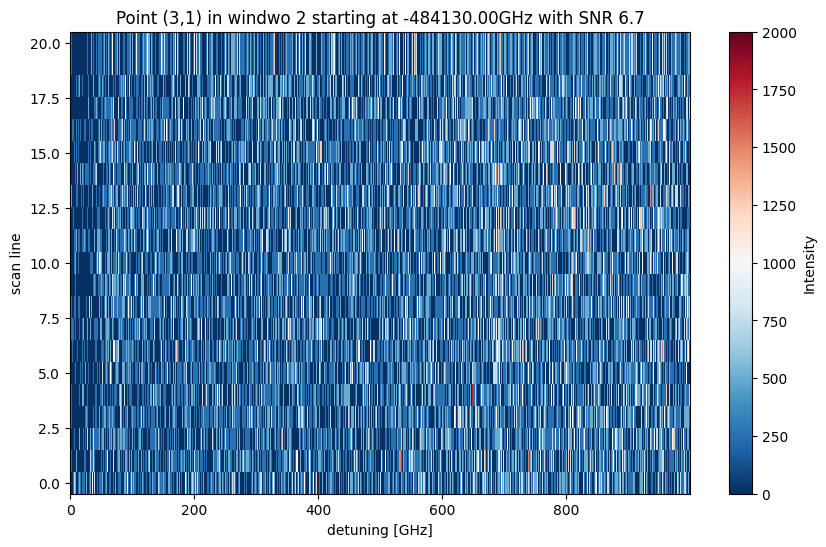

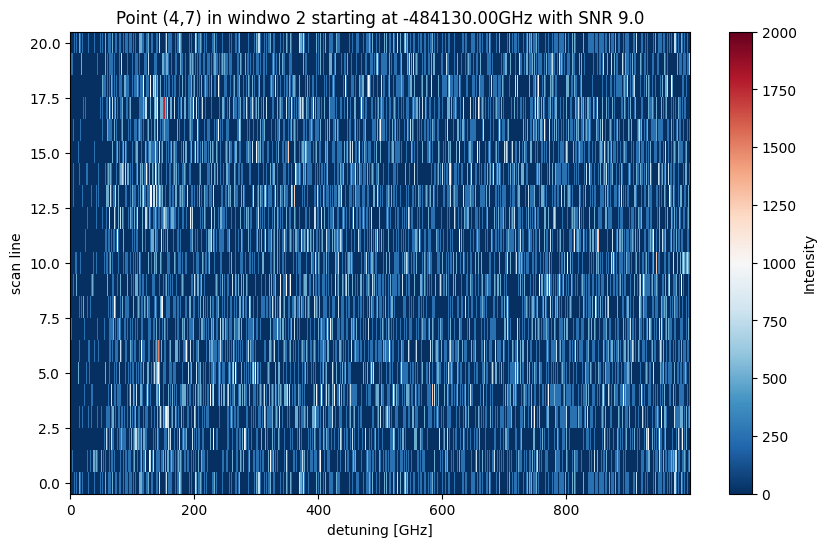

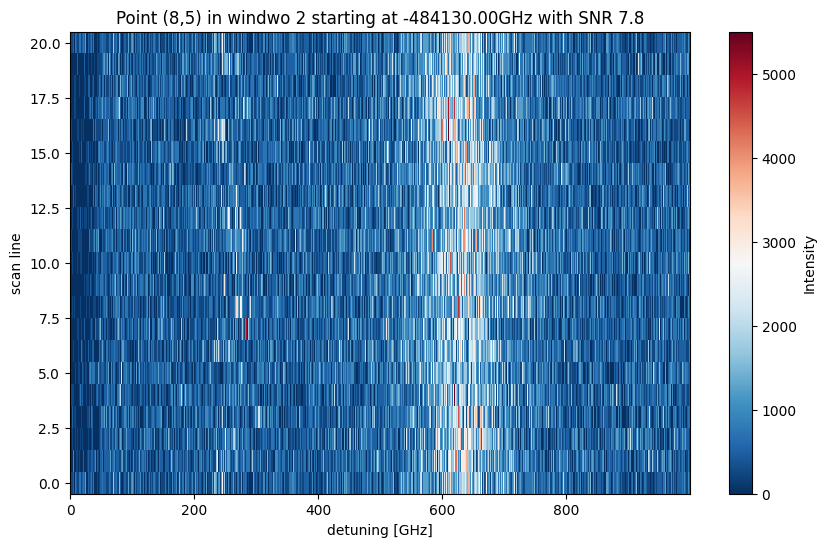

In [ ]:
plot_data_from_dict(data_noise2)